In [ ]:
!git clone https://github.com/davidDKIT/CA2_new_data.git

Cloning into 'CA2_new_data'...
remote: Enumerating objects: 94246, done.
remote: Counting objects: 100% (41547/41547), done.
remote: Compressing objects: 100% (41544/41544), done.
remote: Total 94246 (delta 2), reused 41546 (delta 2), pack-reused 52699
Receiving objects: 100% (94246/94246), 1.28 GiB | 28.46 MiB/s, done.
Resolving deltas: 100% (3/3), done.
Updating files: 100% (41540/41540), done.


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [ ]:
%cd CA2_new_data

/content/CA2_new_data


In [ ]:
datadir = 'DrivingData'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data.head()

<ipython-input-4-7da16e0327ff>:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\center_2024_01_13_20_18_39_004.jpg,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\left_2024_01_13_20_18_39_004.jpg,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\right_2024_01_13_20_18_39_004.jpg,0.0,0.0,0,0.000001
1,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\center_2024_01_13_20_18_39_074.jpg,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\left_2024_01_13_20_18_39_074.jpg,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\right_2024_01_13_20_18_39_074.jpg,0.0,0.0,0,0.000023
2,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\center_2024_01_13_20_18_39_141.jpg,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\left_2024_01_13_20_18_39_141.jpg,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\right_2024_01_13_20_18_39_141.jpg,0.0,0.0,0,0.000006
3,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\center_2024_01_13_20_18_39_211.jpg,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\left_2024_01_13_20_18_39_211.jpg,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\right_2024_01_13_20_18_39_211.jpg,0.0,0.0,0,0.000017
4,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\center_2024_01_13_20_18_39_280.jpg,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\left_2024_01_13_20_18_39_280.jpg,C:\Users\David\Documents\DKIT\Y4\SmartTech\SmartTech_CA2\DrivingData\IMG\right_2024_01_13_20_18_39_280.jpg,0.0,0.0,0,0.000004


In [ ]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2024_01_13_20_18_39_004.jpg,left_2024_01_13_20_18_39_004.jpg,right_2024_01_13_20_18_39_004.jpg,0.0,0.0,0,0.000001
1,center_2024_01_13_20_18_39_074.jpg,left_2024_01_13_20_18_39_074.jpg,right_2024_01_13_20_18_39_074.jpg,0.0,0.0,0,0.000023
2,center_2024_01_13_20_18_39_141.jpg,left_2024_01_13_20_18_39_141.jpg,right_2024_01_13_20_18_39_141.jpg,0.0,0.0,0,0.000006
3,center_2024_01_13_20_18_39_211.jpg,left_2024_01_13_20_18_39_211.jpg,right_2024_01_13_20_18_39_211.jpg,0.0,0.0,0,0.000017
4,center_2024_01_13_20_18_39_280.jpg,left_2024_01_13_20_18_39_280.jpg,right_2024_01_13_20_18_39_280.jpg,0.0,0.0,0,0.000004


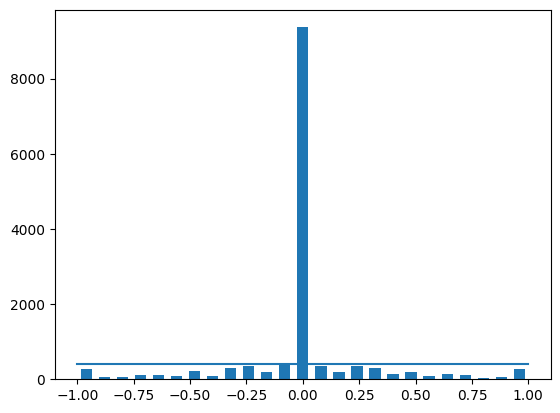

In [ ]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
centre = (bins[:-1] + bins[1:])*0.5
plt.bar(centre, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(
    data['steering'])), (samples_per_bin, samples_per_bin))
plt.show()

In [ ]:
print('total data:', len(data))
print(data.shape)

total data: 13846
(13846, 7)


In [ ]:
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)

In [ ]:
print("Removed: ", len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print("Remaining: ", len(data))

Removed:  8967
Remaining:  4879


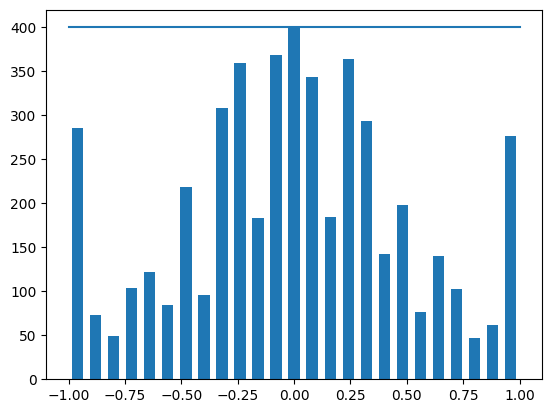

In [ ]:
hist, bins = np.histogram(data['steering'], num_bins)
plt.bar(centre, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(
    data['steering'])), (samples_per_bin, samples_per_bin))
plt.show()

In [ ]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    centre,left,right = indexed_data[0], indexed_data[1],indexed_data[2]
    image_path.append(os.path.join(datadir,centre.strip()))
    steering.append(float(indexed_data[3]))

    image_path.append(os.path.join(datadir, left.strip()))
    steering.append(float(indexed_data[3]) + 0.15)

    image_path.append(os.path.join(datadir, right.strip()))
    steering.append(float(indexed_data[3]) - 0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [ ]:
image_paths, steerings = load_img_steering(datadir+'/IMG', data)

X_train, X_valid, y_train, y_valid = train_test_split(
    image_paths, steerings, test_size=0.2, random_state=6)
print(f"Traing samples {len(X_train)}, validation samples {len(X_valid)}")

Traing samples 11709, validation samples 2928


Text(0.5, 1.0, 'Validation set')

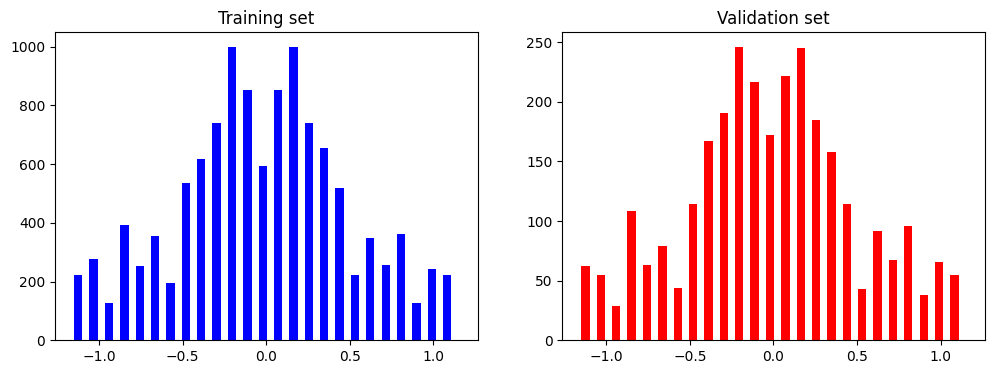

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

In [ ]:
def pan(image_to_pan):
    pan_func = iaa.Affine(translate_percent={"x":(-0.1, 0.1), "y":(-0.1, 0.1)})
    pan_image = pan_func.augment_image(image_to_pan)
    return pan_image

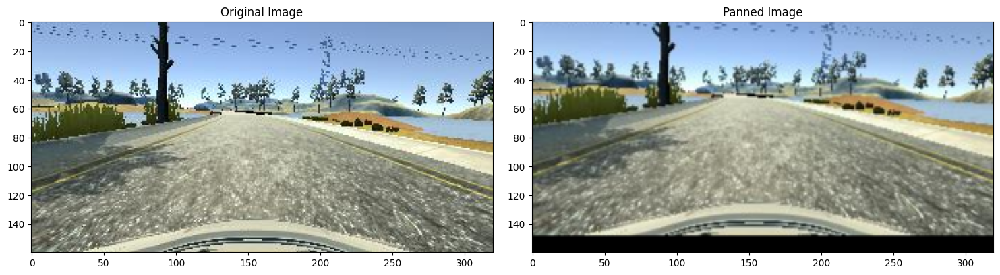

In [ ]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title("Original Image")
axs[1].imshow(panned_image)
axs[1].set_title("Panned Image")
plt.show()

In [ ]:
def zoom(image_to_zoom):
    zoom_func = iaa.Affine(scale=(1, 1.3))
    z_image = zoom_func.augment_image(image_to_zoom)
    return z_image

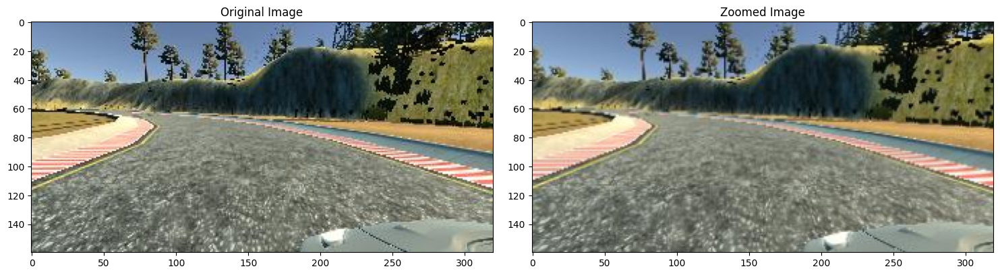

In [ ]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title("Original Image")
axs[1].imshow(zoomed_image)
axs[1].set_title("Zoomed Image")
plt.show()

In [ ]:
def img_random_brightness(image_to_brighten):
    bright_func = iaa.Multiply((0.2, 1.2))
    bright_image = bright_func.augment_image(image_to_brighten).astype("uint8")
    return bright_image

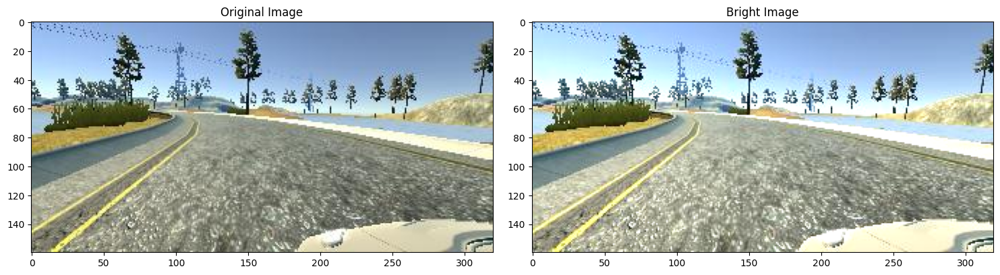

In [ ]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
bright_image = img_random_brightness(original_image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title("Original Image")
axs[1].imshow(bright_image)
axs[1].set_title("Bright Image")
plt.show()

In [ ]:
def img_random_flip(image_to_flip, steering_angle):
    flipped_image = cv2.flip(image_to_flip, 1)
    steering_angle = -steering_angle
    return flipped_image, steering_angle

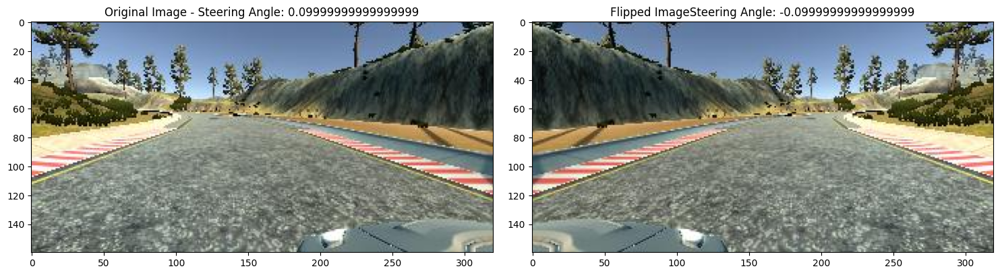

In [ ]:
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_angle = img_random_flip(original_image, steering_angle)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title("Original Image - " + "Steering Angle: " + str(steering_angle))
axs[1].imshow(flipped_image)
axs[1].set_title("Flipped Image"+ "Steering Angle: " + str(flipped_angle))
plt.show()

In [ ]:
# https://chatbotslife.com/using-augmentation-to-mimic-human-driving-496b569760a9
def add_random_shadow(image):
    top_y = 320*np.random.uniform()
    top_x = 0
    bot_x = 160
    bot_y = 320*np.random.uniform()
    image_hls = cv2.cvtColor(image,cv2.COLOR_RGB2HLS)
    shadow_mask = (np.mgrid[0:image.shape[0], 0:image.shape[1]][0] - top_x) * (bot_y - top_y) - (bot_x - top_x) * (np.mgrid[0:image.shape[0], 0:image.shape[1]][1] - top_y) >= 0

    if np.random.randint(2)==1:
        random_bright = .5
        cond1 = shadow_mask==1
        cond0 = shadow_mask==0
        if np.random.randint(2)==1:
            image_hls[:,:,1][cond1] = image_hls[:,:,1][cond1]*random_bright
        else:
            image_hls[:,:,1][cond0] = image_hls[:,:,1][cond0]*random_bright
    image = cv2.cvtColor(image_hls,cv2.COLOR_HLS2RGB)
    return image

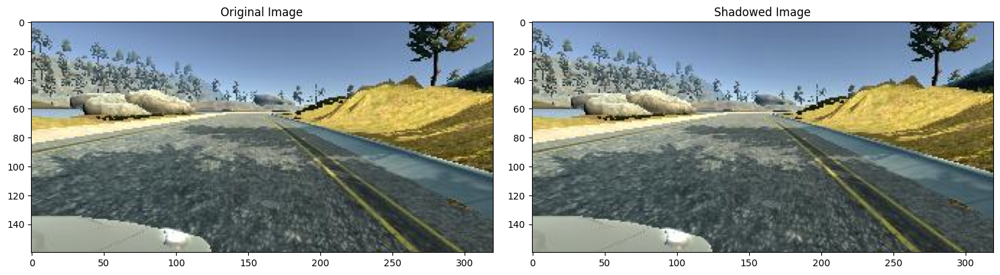

In [ ]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
shadowed_image = add_random_shadow(original_image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title("Original Image")
axs[1].imshow(shadowed_image)
axs[1].set_title("Shadowed Image")

plt.show()

In [ ]:
def random_augment(image_to_augment, steering_angle):
    augment_image = mpimg.imread(image_to_augment)
    if np.random.rand() < 0.5:
        augment_image = zoom(augment_image)
    if np.random.rand() < 0.5:
        augment_image = pan(augment_image)
    if np.random.rand() < 0.5:
        augment_image = img_random_brightness(augment_image)
    if np.random.rand() < 0.5:
        augment_image, steering_angle = img_random_flip(augment_image, steering_angle)
    return augment_image, steering_angle

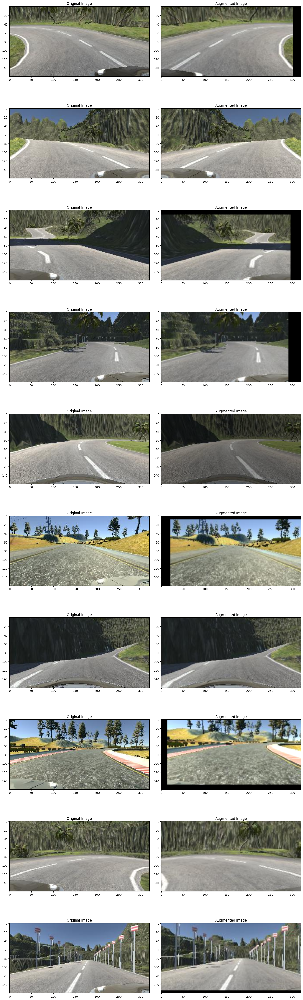

In [ ]:
ncols = 2
nrows = 10
fig, axs = plt.subplots(nrows, ncols, figsize=(15, 50))
fig.tight_layout()
for i in range(10):
    rand_num = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[rand_num]
    random_steering = steerings[rand_num]
    original_image = mpimg.imread(random_image)
    augmented_image, steering_angle = random_augment(random_image, random_steering)
    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")
    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")
plt.show()

In [ ]:
def img_preprocess(img):
    img = mpimg.imread(img)
    img = img[60:135, :, :]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

In [ ]:
def preprocess_img_no_imread(img):
    img = img[60:135, :, :]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, is_training):
    while True:
        batch_img = []
        batch_steering = []
        for i in range(batch_size):
            random_index = random.randint(0, len(image_paths)-1)
            if is_training:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]

            im = preprocess_img_no_imread(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield np.asarray(batch_img), np.asarray(batch_steering)

Text(0.5, 1.0, 'Preprocessed Image')

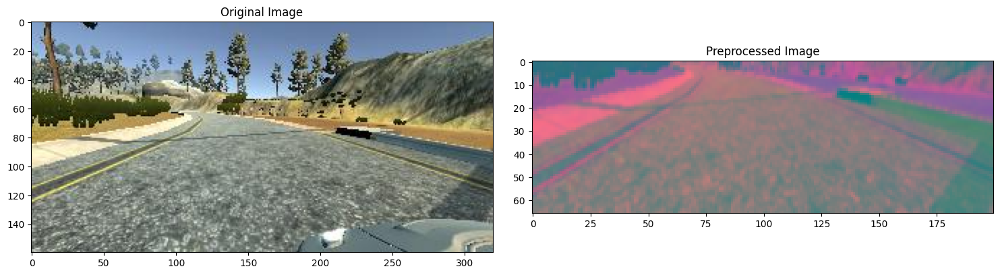

In [ ]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(image)
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title("Original Image")
axes[1].imshow(preprocessed_image)
axes[1].set_title("Preprocessed Image")

In [ ]:
def nvidia_model():
    model = Sequential()
    model.add(Convolution2D(24, kernel_size=(5, 5), strides=(
        2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Convolution2D(36, kernel_size=(5, 5),
              strides=(2, 2), activation='elu'))
    model.add(Convolution2D(48, kernel_size=(5, 5),
              strides=(2, 2), activation='elu'))
    model.add(Convolution2D(64, kernel_size=(3, 3), activation='elu'))
    model.add(Convolution2D(64, kernel_size=(3, 3), activation='elu'))


    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    model.add(Dense(50, activation='elu'))
    model.add(Dense(10, activation='elu'))
    model.add(Dense(1))

    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
    model.compile(loss='mse', optimizer=optimizer)
    return model

In [ ]:
model = nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               1

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history = model.fit(batch_generator(X_train, y_train, 250, 1), steps_per_epoch=300, epochs=15, validation_data=batch_generator(X_valid, y_valid, 250, 0), validation_steps=200, verbose=1, shuffle=1)

Epoch 1/15
300/300 [==============================] - 338s 1s/step - loss: 0.2024 - val_loss: 0.1654
Epoch 2/15
300/300 [==============================] - 316s 1s/step - loss: 0.1551 - val_loss: 0.1272
Epoch 3/15
300/300 [==============================] - 313s 1s/step - loss: 0.1387 - val_loss: 0.1232
Epoch 4/15
300/300 [==============================] - 308s 1s/step - loss: 0.1304 - val_loss: 0.1172
Epoch 5/15
300/300 [==============================] - 315s 1s/step - loss: 0.1218 - val_loss: 0.1090
Epoch 6/15
300/300 [==============================] - 302s 1s/step - loss: 0.1154 - val_loss: 0.1104
Epoch 7/15
300/300 [==============================] - 348s 1s/step - loss: 0.1102 - val_loss: 0.1045
Epoch 8/15
300/300 [==============================] - 302s 1s/step - loss: 0.1061 - val_loss: 0.0974
Epoch 9/15
300/300 [==============================] - 300s 1s/step - loss: 0.1016 - val_loss: 0.1009
Epoch 10/15
300/300 [==============================] - 350s 1s/step - loss: 0.0992 - val_lo

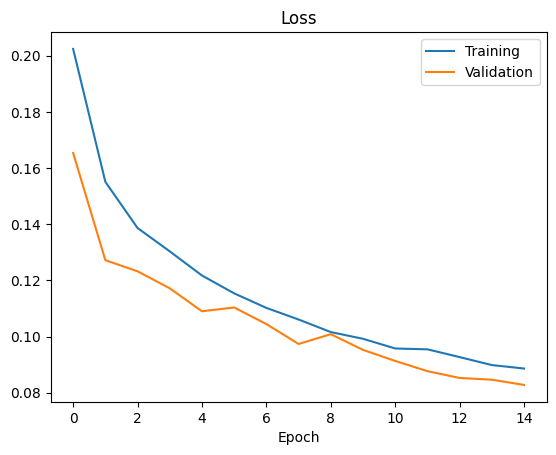

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(["Training", "Validation"])
plt.title('Loss')
plt.xlabel("Epoch")
plt.show()

In [ ]:
model.save('model.h5')
print("Model saved successfully")

Model saved successfully


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
